---
### Imports

In [1]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt

import cv2
from mpl_toolkits.axes_grid1.axes_rgb import RGBAxes, make_rgb_axes

print('OpenCV version: ', cv2.__version__)

OpenCV version:  4.12.0


---
### Load data

In [2]:
# Read Training Data CSV
df_train = pd.read_csv('../data/raw/Training/Train.csv')

In [3]:
# Drop image 332 due to corrupted file
df_train = df_train[df_train['image_id'] != 332].reset_index(drop=True)

In [4]:
# Read RGB images - image values [0,255]

bgr_path_train = '../data/raw/Training/RGBImages/'
rgb_images_train = {}


for image_id in df_train['image_id'].values:
    if image_id % 332 == 0:
        continue
    img = cv2.imread(bgr_path_train + 'RGB_' + str(image_id) + '.png', cv2.IMREAD_COLOR)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    rgb_images_train[image_id] = img
print(f'Loaded {len(rgb_images_train)} training images.')

Loaded 230 training images.


In [5]:
# Read Depth images - image values - 16 bit
depth_path_train = '../data/raw/Training/DepthImages/'

depth_images_train = {}

for image_id in df_train['image_id'].values:
    if image_id % 332 == 0:
        continue
    img = cv2.imread(depth_path_train + 'Depth_' + str(image_id) + '.png', cv2.IMREAD_UNCHANGED)
    depth_images_train[image_id] = img
print(f'Loaded {len(depth_images_train)} training depth images.')


Loaded 230 training depth images.


In [6]:
rgb_images_train[1].shape, depth_images_train[1].shape

((1080, 1920, 3), (1080, 1920))

---
### Crop

In [7]:
# Image 377 has an additional crate on the left side, causing issues with detection.
# Modify the blue-channel method to ignore left part of image when selecting contours.

def draw_overall_crate_box_blue_fix(
    img,
    min_contour_area=500,
    scale=1.1,
    min_box_size=10000,
    morph_kernel_size=15,
    otsu=True,
    left_exclude_frac=0.25,   # NEW: ignore left 25% of image
    debug=False
):
    if img is None:
        return None, None, [], [], None, None

    H, W = img.shape[:2]

    # Split channels (RGB input assumed)
    b = img[:, :, 0].astype(np.float32)
    g = img[:, :, 1].astype(np.float32)
    r = img[:, :, 2].astype(np.float32)

    # Orange score
    score = ((r + g) / 2.0) - b
    score_norm = cv2.normalize(score, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)
    score_blur = cv2.GaussianBlur(score_norm, (7, 7), 0)

    # Threshold
    if otsu:
        _, mask = cv2.threshold(
            score_blur, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU
        )
        if mask.mean() < 1 or mask.mean() > 250:
            _, mask = cv2.threshold(score_blur, 100, 255, cv2.THRESH_BINARY)
    else:
        _, mask = cv2.threshold(score_blur, 100, 255, cv2.THRESH_BINARY)

    # Morphology
    k = max(3, int(morph_kernel_size))
    kernel = np.ones((k, k), np.uint8)
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel, iterations=2)
    mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, np.ones((3, 3), np.uint8), iterations=1)

    # Find contours
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    candidates = []
    cx_img, cy_img = W / 2.0, H / 2.0

    for c in contours:
        area = cv2.contourArea(c)
        if area < min_contour_area:
            continue

        x, y, w, h = cv2.boundingRect(c)
        cx = x + w / 2.0
        cy = y + h / 2.0

        # Reject contours in left part of image
        if cx < W * left_exclude_frac:
            continue

        dist_to_center = np.hypot(cx - cx_img, cy - cy_img)

        candidates.append((dist_to_center, area, c))

    if not candidates:
        if debug:
            return img.copy(), None, [], [], score_norm, mask
        return img.copy(), None, [], []

    # Sort: closest to center first, then by area
    candidates.sort(key=lambda x: (x[0], -x[1]))

    # Take top few
    selected = [c for _, _, c in candidates[:3]]

    output_img = img.copy()
    part_bboxes = []
    centers = []

    x1_all, y1_all = W, H
    x2_all, y2_all = 0, 0

    for c in selected:
        x, y, w, h = cv2.boundingRect(c)
        if w * h < min_box_size:
            continue

        # Expand bbox
        width = int(w * scale)
        height = int(h * scale)
        cx, cy = x + w // 2, y + h // 2

        x1 = max(cx - width // 2, 0)
        y1 = max(cy - height // 2, 0)
        x2 = min(cx + width // 2, W)
        y2 = min(cy + height // 2, H)

        cv2.rectangle(output_img, (x1, y1), (x2, y2), (0, 255, 0), 2)

        part_bboxes.append((x1, y1, x2, y2))
        centers.append((cx, cy))

        x1_all = min(x1_all, x1)
        y1_all = min(y1_all, y1)
        x2_all = max(x2_all, x2)
        y2_all = max(y2_all, y2)

    overall_bbox = None
    if x2_all > x1_all and y2_all > y1_all:
        cv2.rectangle(output_img, (x1_all, y1_all), (x2_all, y2_all), (255, 0, 0), 2)
        overall_bbox = (x1_all, y1_all, x2_all, y2_all)

    if debug:
        return output_img, overall_bbox, part_bboxes, centers, score_norm, mask

    return output_img, overall_bbox, part_bboxes, centers


In [8]:
# Crop images around detected crate using blue-channel method
# Fixed size of 800 square

import tqdm

cropped_width = 800
cropped_height = 800

rgb_train_cropped = {}
depth_train_cropped = {}

for k in tqdm.tqdm(rgb_images_train.keys()):
    rgb_image = rgb_images_train[k]
    output_image, overall_bbox, part_bboxes, centers = draw_overall_crate_box_blue_fix(rgb_image, min_contour_area=500, scale=1.0, min_box_size=15000)
    if overall_bbox is None:
        # Fallback to centre crop if no crate detected
        h, w = rgb_image.shape[:2]
        x1 = max((w - cropped_width) // 2, 0)
        y1 = max((h - cropped_height) // 2, 0)
        x2 = min(x1 + cropped_width, w)
        y2 = min(y1 + cropped_height, h)
        overall_bbox = (x1, y1, x2, y2)
    else:
        # Adjust overall_bbox to fixed size around its center
        cx = (overall_bbox[0] + overall_bbox[2]) // 2
        cy = (overall_bbox[1] + overall_bbox[3]) // 2
        x1 = max(cx - cropped_width // 2, 0)
        y1 = max(cy - cropped_height // 2, 0)
        x2 = min(cx + cropped_width // 2, rgb_image.shape[1])
        y2 = min(cy + cropped_height // 2, rgb_image.shape[0])
        overall_bbox = (x1, y1, x2, y2)

    cropped_rgb_image = rgb_image[overall_bbox[1]:overall_bbox[3], overall_bbox[0]:overall_bbox[2]]
    rgb_train_cropped[k] = cropped_rgb_image
    # Crop the depth image similarly
    depth_image = depth_images_train[k]
    cropped_depth_image = depth_image[overall_bbox[1]:overall_bbox[3], overall_bbox[0]:overall_bbox[2]]
    depth_train_cropped[k] = cropped_depth_image



100%|██████████| 230/230 [00:03<00:00, 60.24it/s]


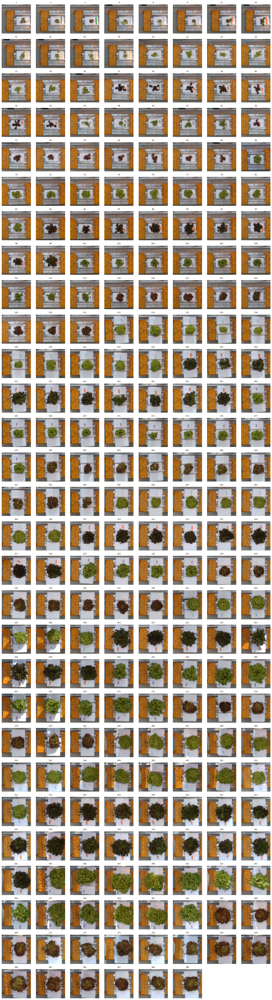

In [9]:
import matplotlib.pyplot as plt
import math

def show_image_dict(img_dict, title_prefix="", max_images=None, cols=8):
    """
    Display images from a dict in a grid.

    img_dict: dict[key -> RGB image]
    max_images: limit number shown (None = all)
    cols: images per row
    """
    keys = list(img_dict.keys())
    keys.sort()
    if max_images is not None:
        keys = keys[:max_images]

    n = len(keys)
    rows = math.ceil(n / cols)

    plt.figure(figsize=(2 * cols, 2 * rows))

    for i, k in enumerate(keys):
        img = img_dict[k]
        ax = plt.subplot(rows, cols, i + 1)
        ax.imshow(img)
        ax.set_title(str(k), fontsize=8)
        ax.axis("off")

    plt.tight_layout()
    plt.show()

show_image_dict(rgb_train_cropped, title_prefix="train")

In [11]:
# Save the cropped images to disk
import os
cropped_rgb_train_path = '../data/processed/crops/Training/RGBImages/'
cropped_depth_train_path = '../data/processed/crops/Training/DepthImages/'
os.makedirs(cropped_rgb_train_path, exist_ok=True)
os.makedirs(cropped_depth_train_path, exist_ok=True)

for k in rgb_train_cropped.keys():
    cv2.imwrite(os.path.join(cropped_rgb_train_path, f'cropped_RGB_{k}.png'), cv2.cvtColor(rgb_train_cropped[k], cv2.COLOR_RGB2BGR))
    cv2.imwrite(os.path.join(cropped_depth_train_path, f'cropped_Depth_{k}.png'), depth_train_cropped[k])
